In [1]:
!nvidia-smi

Fri Jul 12 23:55:34 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 546.92                 Driver Version: 546.92       CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 4080 ...  WDDM  | 00000000:01:00.0  On |                  N/A |
| N/A   62C    P0              31W / 127W |    603MiB / 12282MiB |      1%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
# Import relevant modules

# Import modules for vector calculations
import numpy as np
import scipy as sp
import pandas as pd
import scipy.linalg as la
import scipy.optimize as opt

# Import modules for plotting
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.colorbar as colorbar
%matplotlib inline

# Import modules for file handling 
import os
import io
import sys
import warnings
warnings.filterwarnings('ignore')
from glob import glob
from tifffile import imread, imsave
from skimage import io, measure
import time

# Import modules for Deep Learning
import torch as torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
import torch.utils.data as data
from torch.utils.data import DataLoader
import pytorch_lightning as pl
from pytorch_lightning import Trainer
from torchsummary import summary
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping, LearningRateMonitor
torch.set_float32_matmul_precision("medium|high")

# Import custom modules
from OriginalGAPUNet import UNet
from AttentionUNetArchitecture import AttentionUNet
from BinomDataset2 import BinomDataset

In [3]:
# Using the GPU for computations
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [4]:
Data = np.concatenate((imread(r'trainingDataGT.tif'), imread(r'testDataGT.tif')))

(2048, 512, 512)


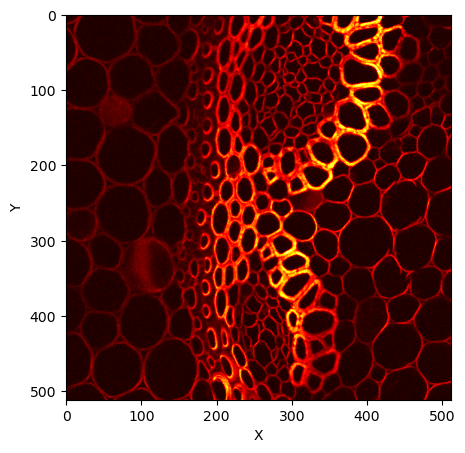

In [5]:
# Review the Dataset
plt.figure(figsize=(5,5))
plt.imshow(Data[2000], cmap='hot')
print(Data.shape)
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

In [6]:
def psnrToString(inp):
    if inp < 0:
        return "m"+str(-inp)
    else:
        return str(inp)
    
# We set the pseudo PSNR range used for splitting the images into input and target
minpsnr = -40
maxpsnr = -5

name = psnrToString(minpsnr) + "to" + psnrToString(maxpsnr) + "-256x256"
CHECKPOINT_PATH = "./models/" 

In [7]:
Train_Psnr_Distribution = torch.randint(torch.tensor([minpsnr]), torch.tensor([maxpsnr]), (round(Data.shape[0]*0.8),))
len(Train_Psnr_Distribution)

1638

In [8]:
Valid_Psnr_Distribution = torch.randint(torch.tensor([minpsnr]), torch.tensor([maxpsnr]), (round(Data.shape[0]*0.2,),))
len(Valid_Psnr_Distribution)

410

In [9]:
maxepochs = 20 # Train for longeer if needed

# Create the pytorch dataset
Train_Dataset = BinomDataset(Data[:round(Data.shape[0]*0.8)], 1, 256, minpsnr, maxpsnr, virtSize= 512 *32)
Valid_Dataset = BinomDataset(Data[round(Data.shape[0]*0.8):], 1, 256, minpsnr, maxpsnr)

# Create the Dataloaders for the training and validation sets
Train_Loader = DataLoader(Train_Dataset, batch_size = 32, shuffle = True, drop_last = True, pin_memory=False)
Validation_Loader = DataLoader(Valid_Dataset, batch_size = 32, shuffle = False, drop_last = True, pin_memory=False)

img_input, psnr_map, target_img  = next(iter(Train_Loader))
print("Image Input: ",img_input.shape)
print("Psnr_Map", psnr_map.shape)
print("target_img", target_img.shape)

# Define the callbacks for the model training and validation.
early_stopping_callback = EarlyStopping(monitor='val_loss', patience=10, verbose=True, mode='min')
lr_monitor = LearningRateMonitor(logging_interval='step')
checkpoint_callback = ModelCheckpoint(monitor='val_loss', save_top_k=1, mode='min', verbose=True)


# Create the U-net model
in_channels = 1
intermediary_channels = 2
out_channels = 1
levels = 10
depth = 6
start_filts = 28
up_mode = 'transpose'
embedding_dim = 64

#Model = UNet(channels = in_channels, levels=levels, depth=depth,
                 #start_filts=start_filts, up_mode = up_mode).to(device)


Image Input:  torch.Size([32, 1, 256, 256])
Psnr_Map torch.Size([32, 1, 256, 256])
target_img torch.Size([32, 1, 256, 256])


In [10]:
len(Train_Loader)

512

In [ ]:
summary(Model, (1, 256, 256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 28, 256, 256]           2,548
            Conv2d-2         [-1, 28, 256, 256]           7,084
            Conv2d-3         [-1, 28, 256, 256]           7,084
         MaxPool2d-4         [-1, 28, 128, 128]               0
          DownConv-5  [[-1, 28, 128, 128], [-1, 28, 256, 256]]               0
            Conv2d-6         [-1, 56, 128, 128]          14,168
            Conv2d-7         [-1, 56, 128, 128]          28,280
            Conv2d-8         [-1, 56, 128, 128]          28,280
         MaxPool2d-9           [-1, 56, 64, 64]               0
         DownConv-10  [[-1, 56, 64, 64], [-1, 56, 128, 128]]               0
           Conv2d-11          [-1, 112, 64, 64]          56,560
           Conv2d-12          [-1, 112, 64, 64]         113,008
           Conv2d-13          [-1, 112, 64, 64]         113,008
        Max

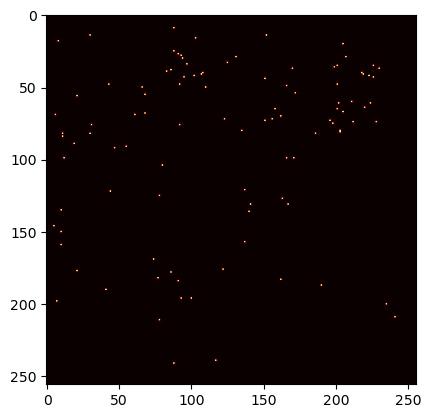

In [12]:
plt.imshow(img_input[2].detach().cpu().permute(1,2,0).squeeze(), cmap='hot')
plt.show()

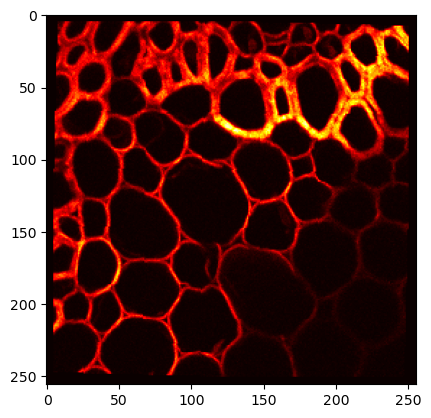

In [13]:
plt.imshow(target_img[2].detach().cpu().permute(1,2,0).squeeze(), cmap='hot')
plt.show()

In [16]:
Model.forward(img_input.to(device)).shape

torch.Size([32, 1, 256, 256])

In [17]:
Trainer = pl.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=maxepochs, 
                     callbacks=[ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_loss"),
                                LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience=25)])
Trainer.fit(Model, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 4080 Laptop GPU') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name       | Type       | Params
------------------------------------------
0 | conv_final | Conv2d     | 29    
1 | down_convs | ModuleList | 24.1 M
2 | up_convs   | ModuleList | 9.4 M 
------------------------------------------
33.4 M    Trainable params
0         Non-trainable params
33.4 M    Total params
133.774   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=20` reached.


In [18]:
Trainer.test(Model, Train_Loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.30451396107673645    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.30451396107673645}]

In [20]:
Trainer.test(Model, Validation_Loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    -0.2279701828956604    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.2279701828956604}]

In [21]:
dataTest = imread(r'testData.tif')[:1]     # to speed things up, we are only doing the first image
dataTestGT = imread(r'testDataGT.tif')[:1]
dataTest.shape

(1, 512, 512)

(512, 512)
-11.500555581049394
torch.Size([512, 512])


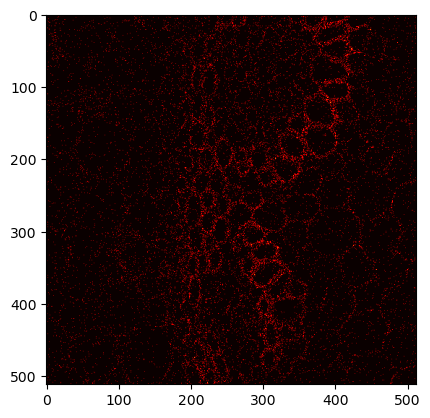

In [22]:
for inp, gt in zip(dataTest, dataTestGT):  
    print(inp.shape)
    Psnr = np.log10(inp.mean().item()+ 1e-50) *10
    Psnr = max(-40,Psnr)
    print(Psnr)
    Psnr = max(-40,Psnr)
    Psnr = torch.FloatTensor([Psnr]).to(device)
    Psnr_map = Psnr.unsqueeze(-1).expand(inp.shape).type(torch.float32)
    print(Psnr_map.shape)
    plt.imshow(inp, cmap = "hot")
    plt.show()
    break

In [29]:
model = UNet.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

332 0 44.3373404001294 272.0 17.0


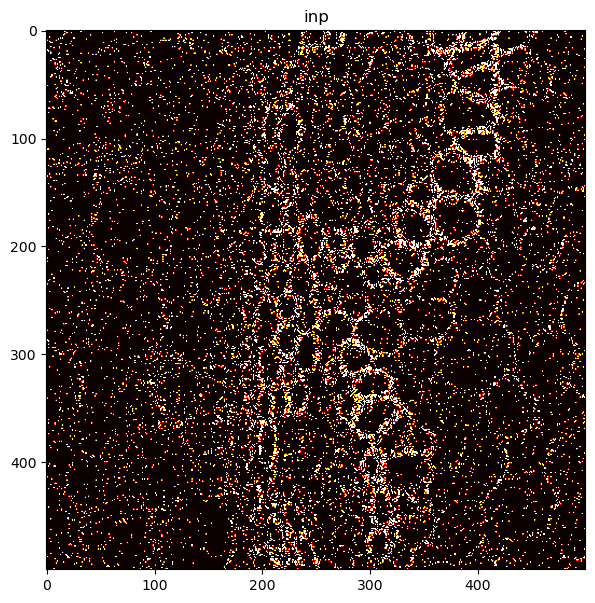

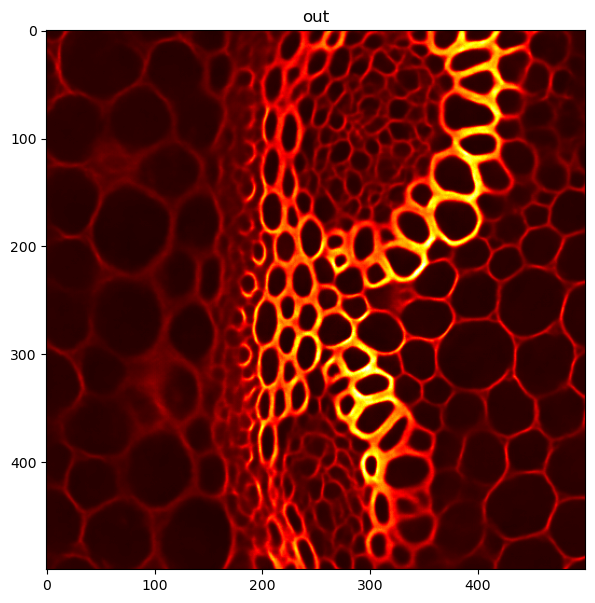

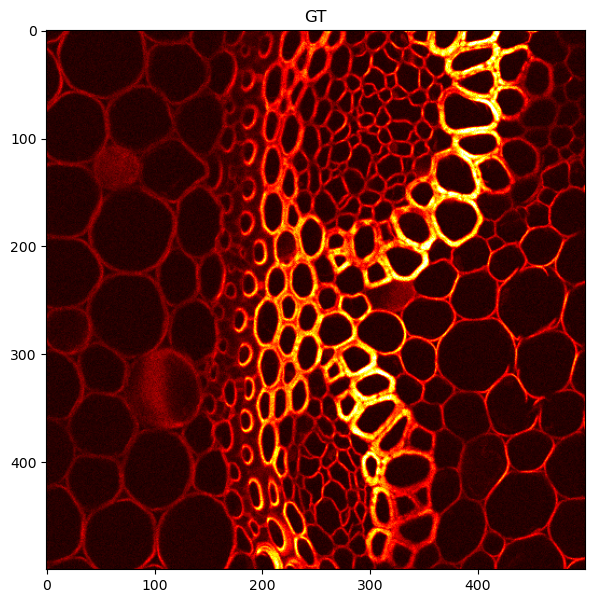

In [31]:
outputs = []
for inp, gt in zip(dataTest, dataTestGT):  
    inpT = torch.from_numpy(inp.astype(np.float32)).to(device)
    Psnr = np.log10(inpT.mean().item()+ 1e-50) *10
    Psnr = max(-40,Psnr)
    Psnr = torch.FloatTensor([Psnr]).to(device)
    Psnr_map = Psnr.unsqueeze(-1).expand(inpT.shape).type(torch.float32)
    # We have to apply softmax over pixels
    out = torch.exp(model(inpT[None,None,...]).detach().cpu())
    out = inp.sum() * out / out.sum()
    outputs.append(out.numpy()[0,0])
    
    print(gt.max(), gt.min(), gt.std(), np.percentile(gt,99.9), np.percentile(gt,50))
    
    inp = inp/inp.mean()
    out = out/out.mean()
    gt = gt/gt.mean()
    vmax = np.percentile(gt,99.9)
    
    plt.figure(figsize=(7,7))
    plt.imshow(inp[:500,:500],vmin = 0, vmax = vmax, cmap = "hot")
    plt.title('inp')
    plt.show()
    
    plt.figure(figsize=(7,7))
    plt.imshow(out[0,0][:500,:500],vmin = 0,vmax = vmax, cmap = "hot")
    plt.title('out')
    plt.show()
    
    plt.figure(figsize=(7,7))
    plt.imshow(gt[:500,:500],vmin = 0,vmax = vmax, cmap = "hot")
    plt.title('GT')

In [32]:
outputs = np.array(outputs)
imsave(r'output.tif',outputs, imagej = True)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
166


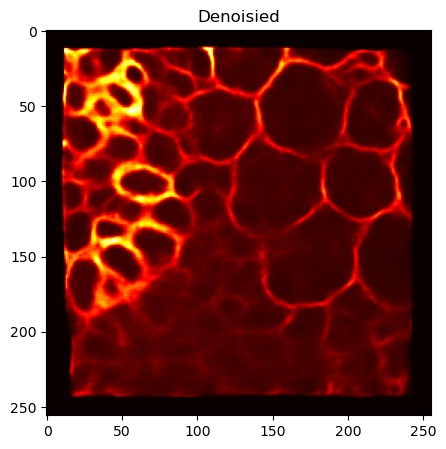

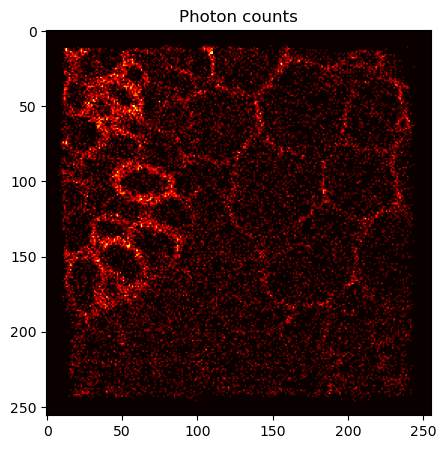

_______________________________________ 166
time (s): 1.5791685581207275 time per image (s) 1.5791685581207275


In [42]:
import matplotlib.image as mpimg
import time
import numpy as np
from Inference import sample_image

# We are starting with an image containing zeros,
# i.e., sampling from scratch

# we just have 1 channel
channels = 1
# we can sample multiple images at the same time in a batch
batch_size = 1
# for best results this should correspond to training pach size
pixels_x = 256
pixels_y = 256

inp_img =  torch.zeros(batch_size ,channels, pixels_y, pixels_x).to(device)


for i in range(1):
    

    startTime = time.time()
    
    # sampling the image(s)
    #print(inp_img.shape)
    denoised, photons, stack, iterations = sample_image(inp_img,
                                                        model, 
                                                        beta = 0.05,
                                                        save_every_n = 10,
                                                        max_psnr = -5)

    
    # In case we do multiple images in a batch, we show all of them.
    for j in range(denoised.shape[0]):
            print(iterations)

            #print(denoised.shape)
            plt.figure(figsize = (5,5))
            plt.imshow(denoised[j,0], cmap='hot', vmin = 0,
                       vmax = np.percentile(denoised[j],99.99))
            plt.title('Denoisied')
            plt.show()
            
            plt.figure(figsize = (5,5))
            plt.imshow(photons[j,0], cmap='hot', vmin = 0,
                       vmax = np.percentile(photons[j],99.99))
            plt.title('Photon counts')
            plt.show()
            
            
    
    print('_______________________________________', iterations)
    
    endTime = time.time()
    elapsedTime = endTime - startTime
    print('time (s):', elapsedTime, 'time per image (s)', elapsedTime/denoised.shape[0])

0


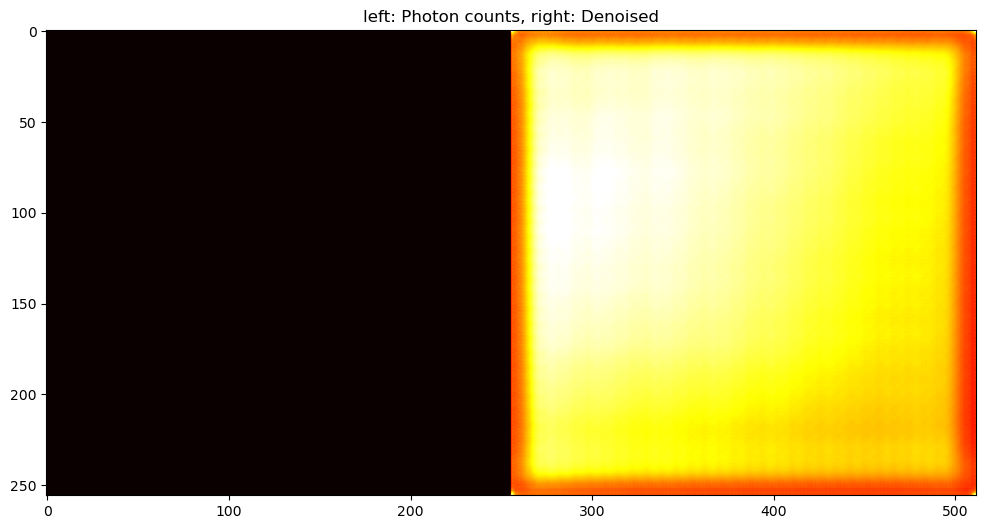

1


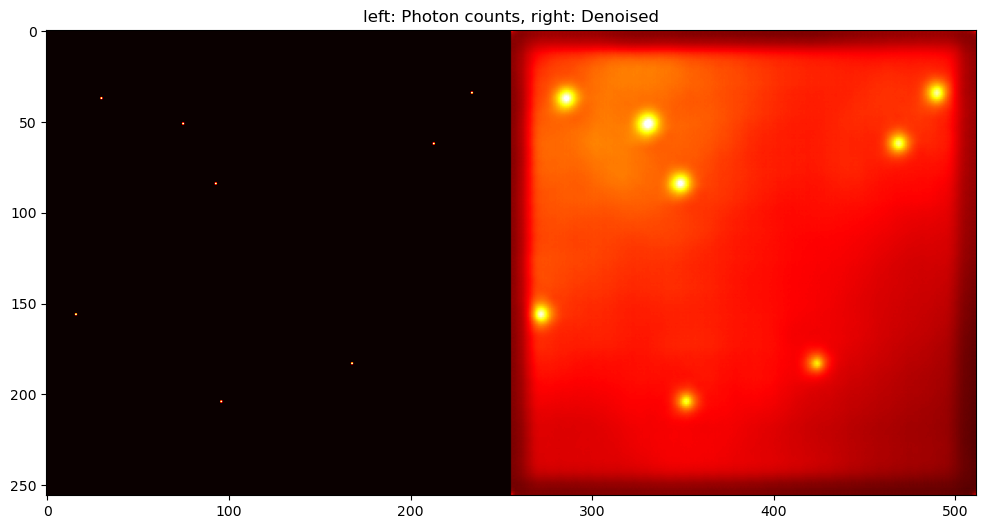

2


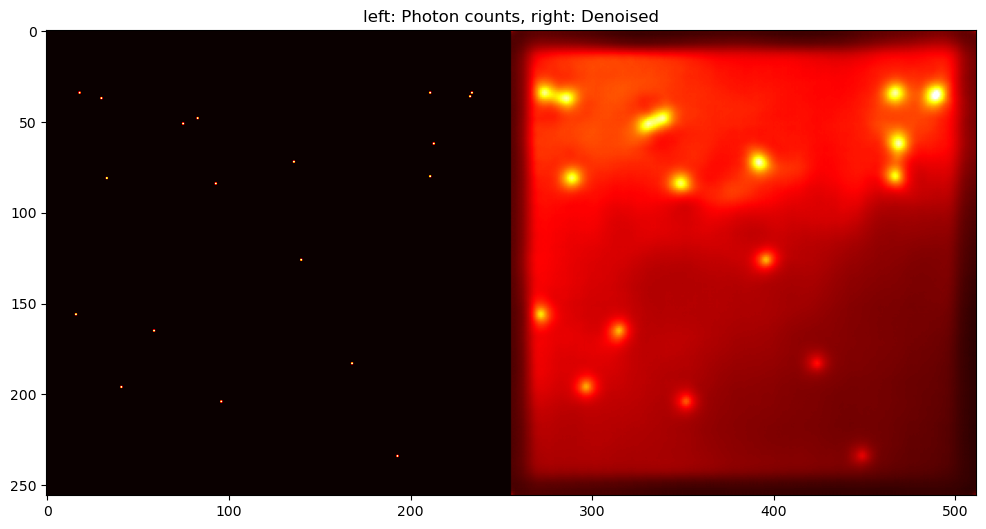

3


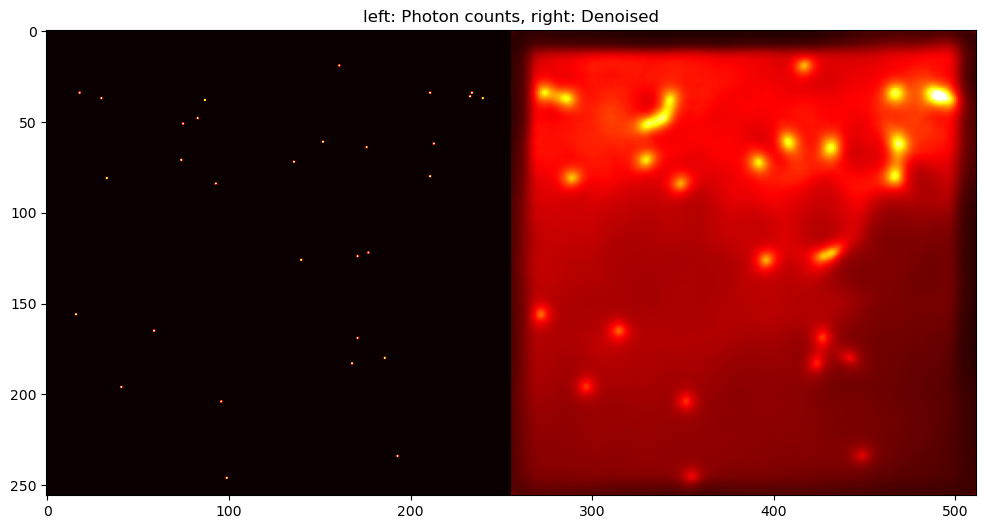

4


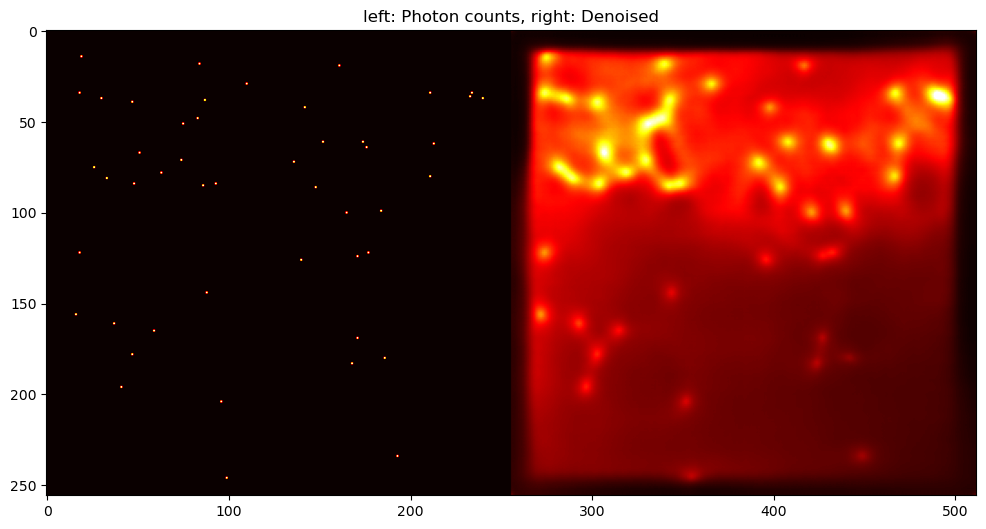

5


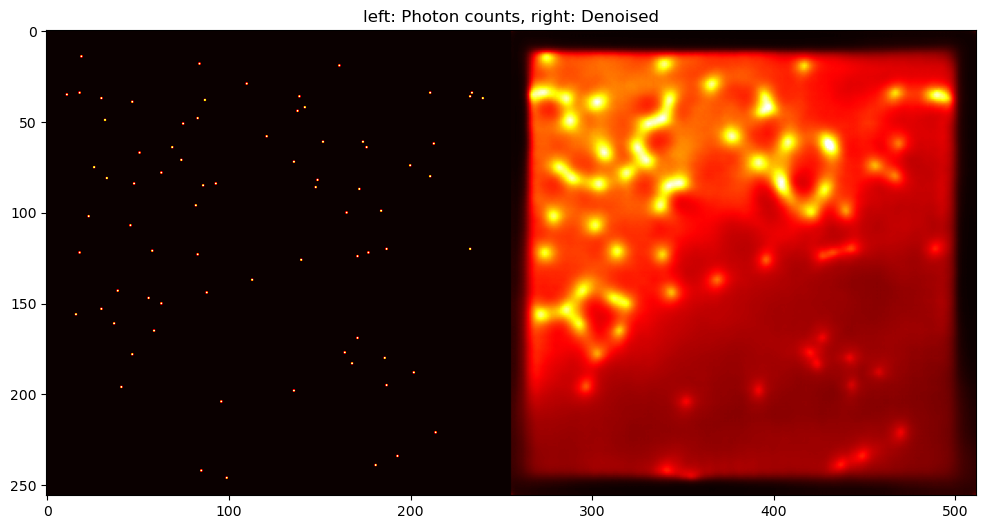

6


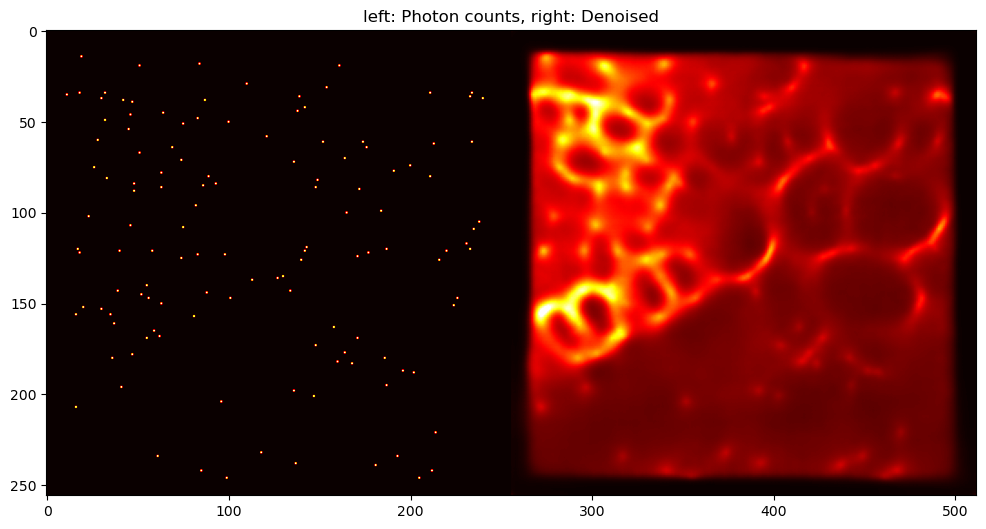

7


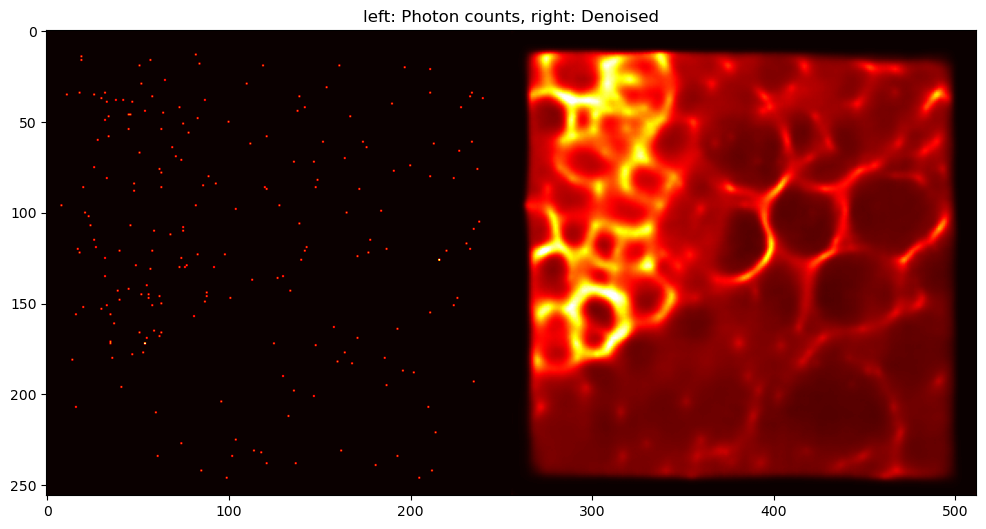

8


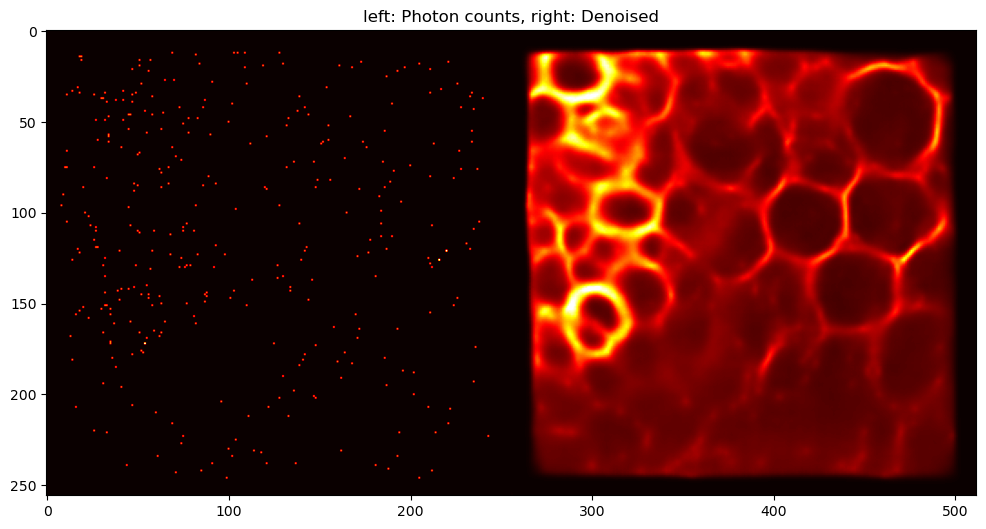

9


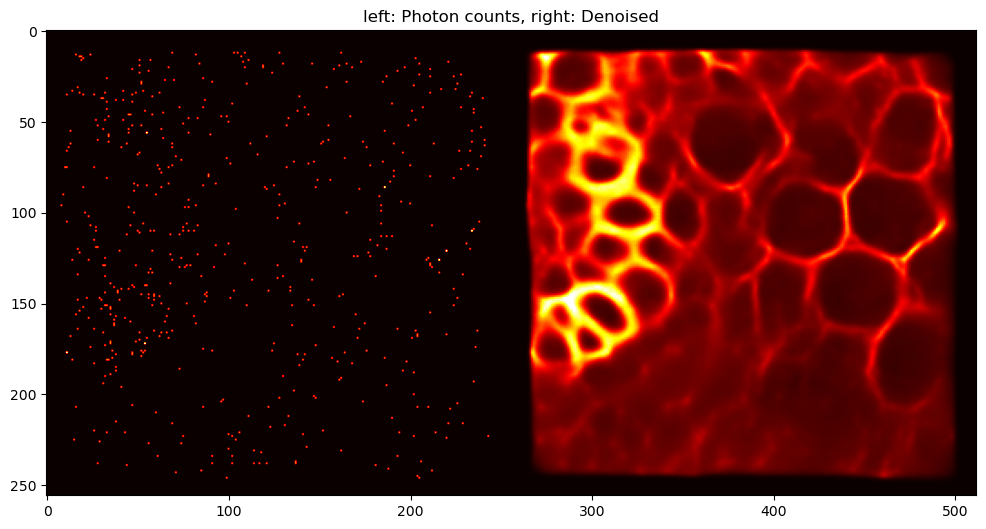

10


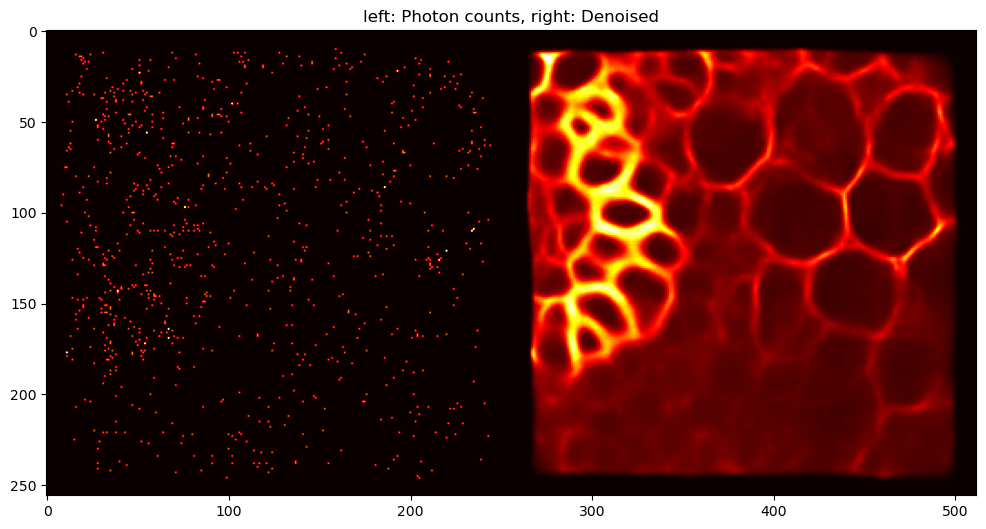

11


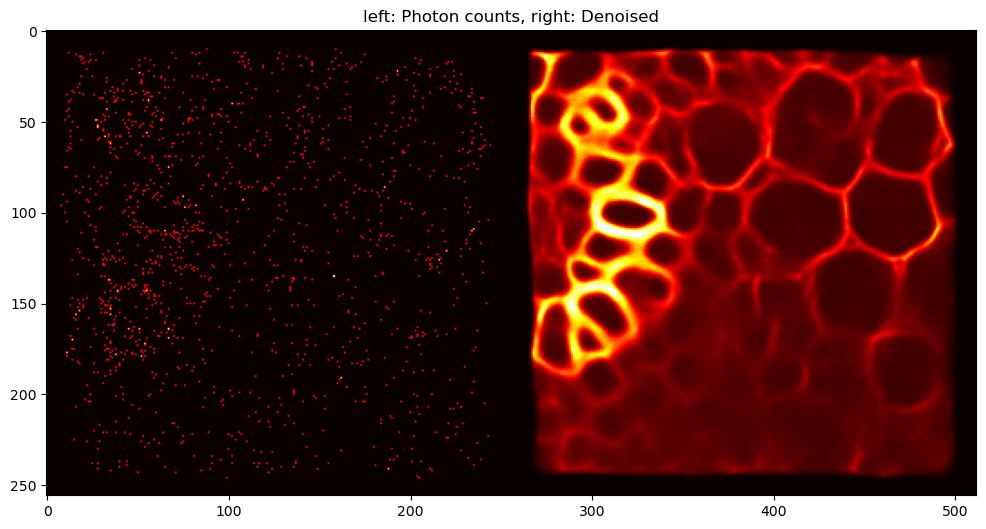

12


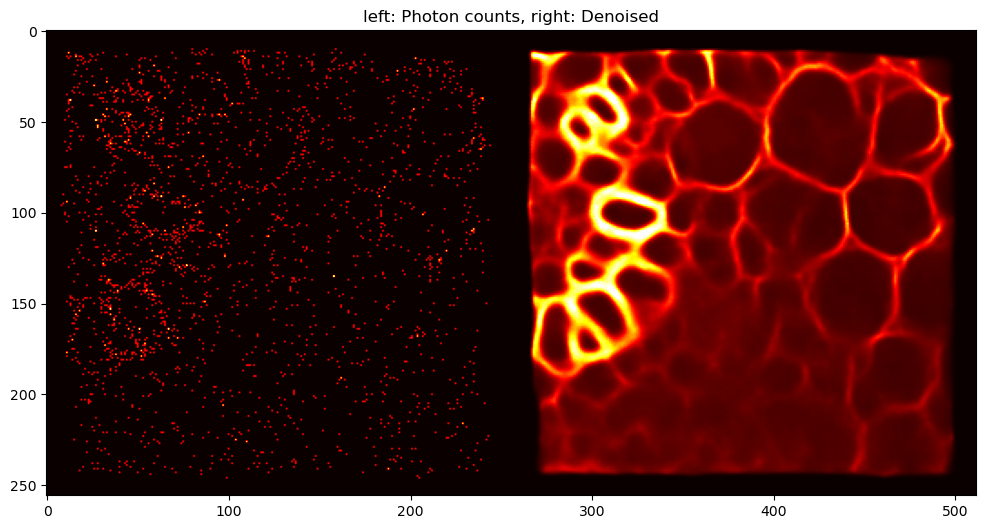

13


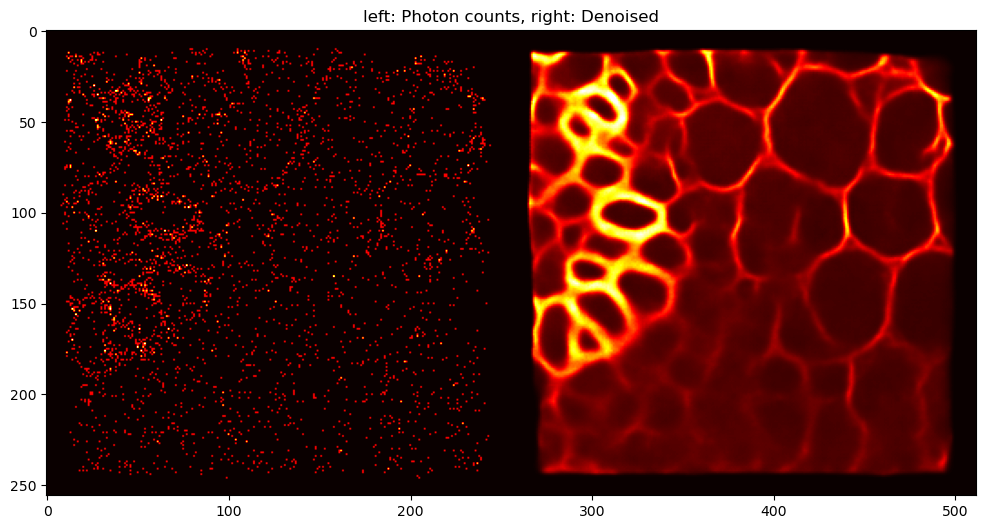

14


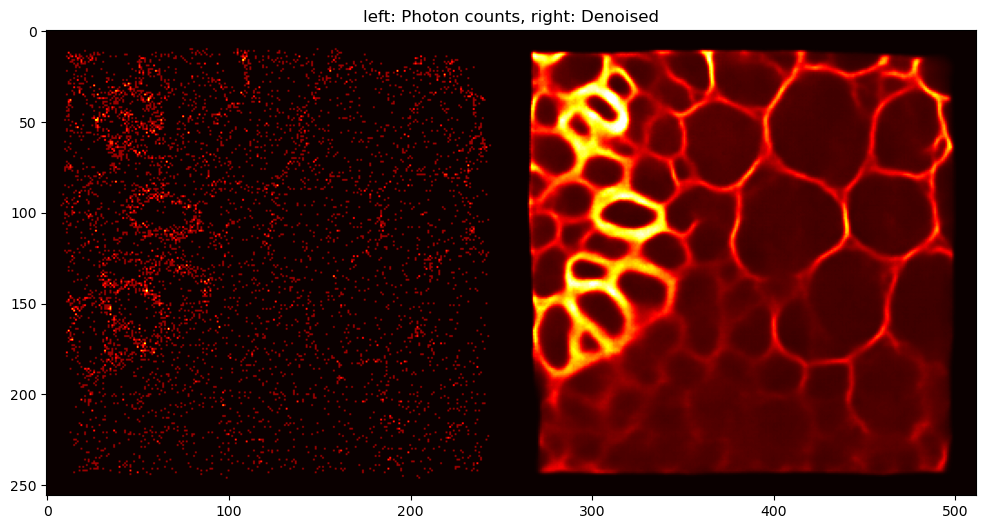

15


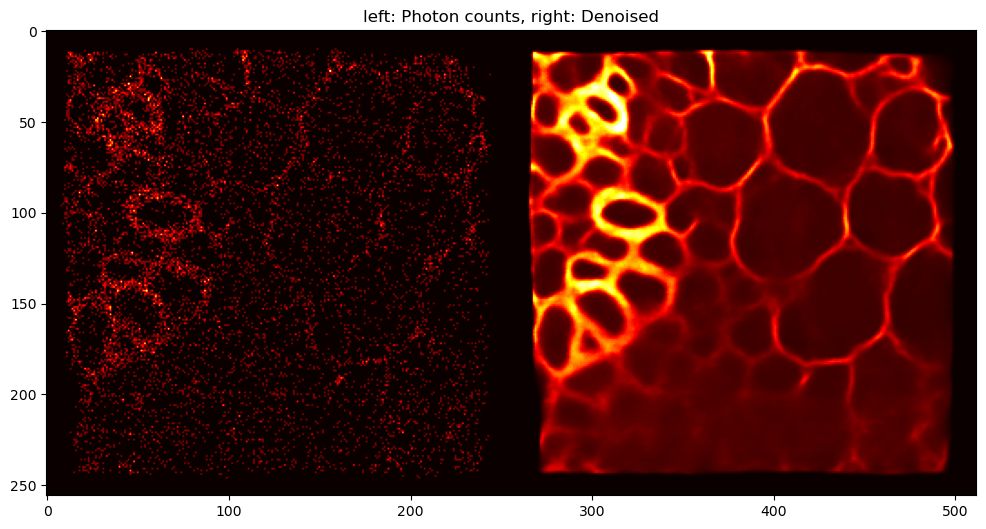

16


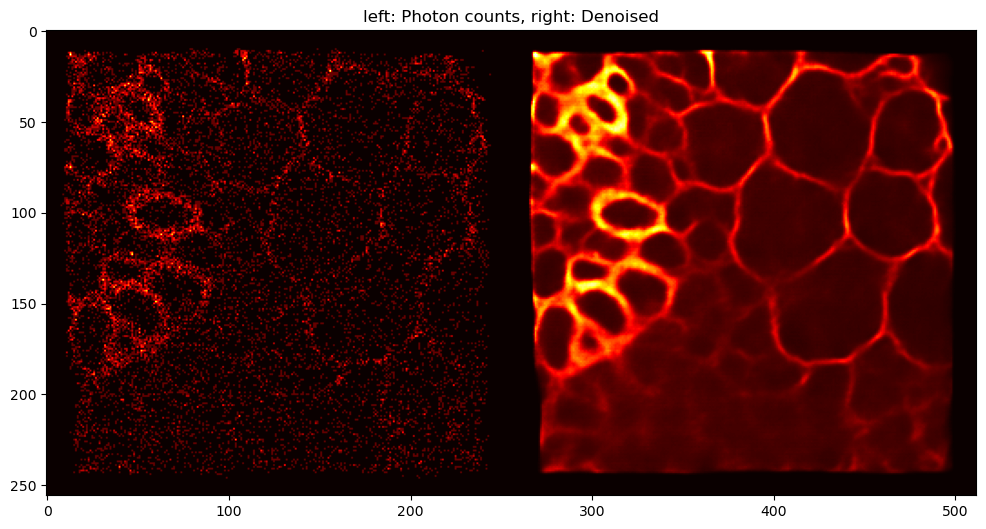

In [43]:
stack[0].shape
for i in range(len(stack)):
    im = stack[i]
    print(i)
    plt.figure(figsize = (12,12))
    plt.imshow(im,cmap ='hot', vmax = 0.9)
    plt.title('left: Photon counts, right: Denoised')
    plt.show()

In [11]:
# Define the Attention Unet Model

# Define the Hyperparameters of the Model:
initial_channels = 4
image_channels = 1
blocks_per_channel = 3
n_groups = 4
n_heads = 8
channels_list = [8,16,32,64,128,256,512]
dim_k = 64
group_size = 32
reduction_factor = 4
dropout_rate = 0.40
time_channels = 64
bottleneck_factor = 2
units = 32
bottleneck_units = 64
conv_type = "Residual_Block"
attn_type_list = [None, None, None, None, None, "Attention", "Attention"]
merge_type = "add"
middle_attn_type = "Attention"
upsample_type = "transpose"
maxpsnr = -5.0
transpose = True
minpsnr = -40.0
num_timesteps = 1024

# Define the Attention Network:
AttnUNet = AttentionUNet(
        initial_channels = initial_channels,
        channels_list = channels_list,
        blocks_per_channel = blocks_per_channel,
        n_groups = n_groups,
        n_heads = n_heads,
        dim_k = dim_k,
        dropout_rate = dropout_rate,
        time_channels = time_channels,
        bottleneck_factor = bottleneck_factor,
        units = units,
        bottleneck_units= bottleneck_units,
        conv_type = conv_type,
        attn_type_list = attn_type_list,
        merge_type = merge_type,
        maxpsnr = maxpsnr,
        minpsnr = minpsnr,
        num_timesteps = num_timesteps,
        image_channels = image_channels,
        reduction_factor= reduction_factor,
        num_groups= n_groups,
        middle_attn_type= middle_attn_type,
        upsample_type = upsample_type
        )

In [12]:
AttnUNet = AttnUNet.to(device)
AttnUNet

AttentionUNet(
  (Image_Projection): LazyConv2d(0, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (input_norm): GroupNorm(4, 4, eps=1e-05, affine=True)
  (input_Mish): Mish()
  (Temporal_Embedding): Temporal_Embedder(
    (Linear_1): Linear(in_features=4, out_features=16, bias=True)
    (Linear_2): Linear(in_features=16, out_features=16, bias=True)
  )
  (Final_Upsample): Up_Block(
    (Conv_Block): Residual_Block(
      (time_embedding): Linear(in_features=16, out_features=4, bias=True)
      (conv1): Conv2d(8, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv2): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (conv3): Conv2d(8, 4, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (GroupNorm_1): GroupNorm(4, 8, eps=1e-05, affine=True)
      (GroupNorm_2): GroupNorm(4, 4, eps=1e-05, affine=True)
      (dropout): Dropout(p=0.4, inplace=False)
    )
    (Upsample): ConvTranspose2d(8, 8, kernel_size=(2, 2), stride=(

In [13]:
AttnUNet.forward(img_input.to(device), psnr_map.to(device).min()).shape

torch.Size([32, 1, 256, 256])

In [35]:
name = "AttentionUNet-256x256"
CHECKPOINT_PATH = "./models/" 
Trainer = pl.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=maxepochs, 
                     callbacks=[ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_loss"),
                                LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience = 5)])
Trainer.fit(AttnUNet, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name               | Type              | Params
----------------------------------------------------------
0  | Image_Projection   | Conv2d            | 256   
1  | input_norm         | GroupNorm         | 8     
2  | input_Mish         | Mish              | 0     
3  | Temporal_Embedding | Temporal_Embedder | 352   
4  | Final_Upsample     | Up_Block          | 820   
5  | DownBlocks         | ModuleList        | 11.4 M
6  | MiddleBlocks       | ModuleList        | 11.0 M
7  | UpBlocks           | ModuleList        | 8.9 M 
8  | output_norm        | GroupNorm         | 8     
9  | output_Mish        | Mish              | 0     
10 | Output_Layer       | Conv2d            | 5     
----------------------------------------------------------
31.3 M    Trainable params
0         Non-trainable 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [14]:
name = "AttentionUNet-256x256"
CHECKPOINT_PATH = "./models/" 
Trainer = pl.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=maxepochs, 
                     callbacks=[ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_loss"),
                                LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience = 20)])
Trainer.fit(AttnUNet, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 4080 Laptop GPU') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name               | Type              | Params
----------------------------------------------------------
0  | Image_Projection   | Conv2d            | 256   
1  | input_norm         | GroupNorm         | 8     
2  | input_Mish         | Mish              | 0     
3  | Temporal_Embedding | Temporal_Embedder | 352   
4  | Final_Upsample     | Up_Block          | 820   
5  | DownBlocks         | ModuleList        | 11.4 M


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=20` reached.


In [37]:
name = "AttentionUNet-256x256"
CHECKPOINT_PATH = "./models/" 
Trainer = pl.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=maxepochs, 
                     callbacks=[ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_loss"),
                                LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience = 20)])
Trainer.fit(AttnUNet, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name               | Type              | Params
----------------------------------------------------------
0  | Image_Projection   | Conv2d            | 440   
1  | input_norm         | GroupNorm         | 16    
2  | input_Mish         | Mish              | 0     
3  | Temporal_Embedding | Temporal_Embedder | 1.3 K 
4  | Final_Upsample     | Up_Block          | 3.2 K 
5  | DownBlocks         | ModuleList        | 10.4 M
6  | MiddleBlocks       | ModuleList        | 11.0 M
7  | UpBlocks           | ModuleList        | 7.3 M 
8  | output_norm        | GroupNorm         | 16    
9  | output_Mish        | Mish              | 0     
10 | Output_Layer       | Conv2d            | 9     
----------------------------------------------------------
28.7 M    Trainable params
0         Non-trainable 

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=20` reached.


In [38]:
Trainer.test(AttnUNet, Train_Loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │   -0.28266850113868713    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.28266850113868713}]

In [39]:
Trainer.test(AttnUNet, Validation_Loader)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_loss         │    -0.1980348527431488    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': -0.1980348527431488}]

In [16]:
name = "AttentionUNet-256x256"
CHECKPOINT_PATH = "./models/" 
Trainer = pl.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=maxepochs, 
                     callbacks=[ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_loss"),
                                LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience = 20)])
Trainer.fit(AttnUNet, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 4080 Laptop GPU') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name               | Type              | Params
----------------------------------------------------------
0  | Image_Projection   | Conv2d            | 368   
1  | input_norm         | GroupNorm         | 16    
2  | input_Mish         | Mish              | 0     
3  | Temporal_Embedding | Temporal_Embedder | 1.3 K 
4  | Final_Upsample     | Up_Block          | 8.2 K 
5  | DownBlocks         | ModuleList        | 10.1 M


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

In [40]:
dataTest = imread(r'testData.tif')[:1]     # to speed things up, we are only doing the first image
dataTestGT = imread(r'testDataGT.tif')[:1]
dataTest.shape

(1, 512, 512)

In [44]:
model = AttentionUNet.load_from_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt').to(device)

332 0 44.3373404001294 272.0 17.0


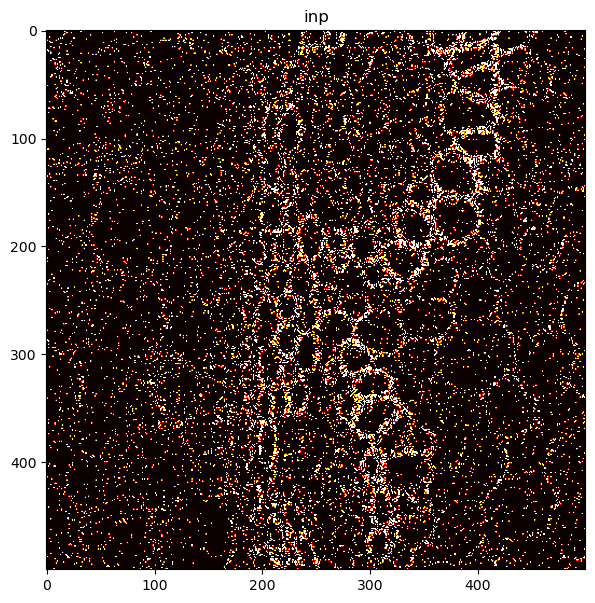

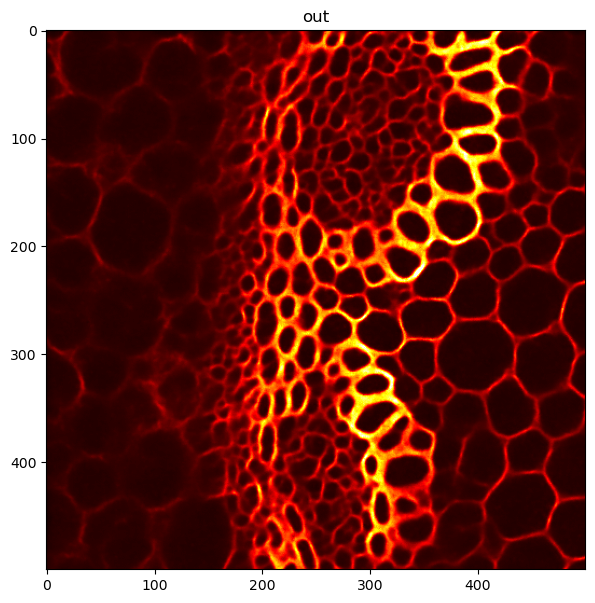

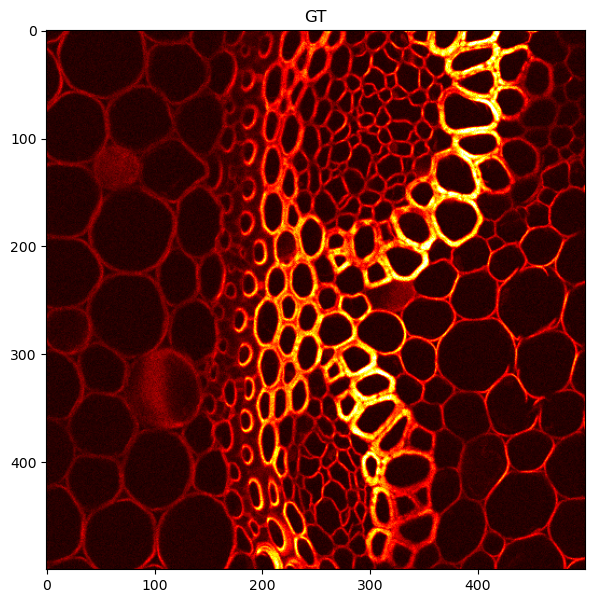

In [52]:
outputs = []
for inp, gt in zip(dataTest, dataTestGT):  
    inpT = torch.from_numpy(inp.astype(np.float32)).to(device)
    Psnr = np.log10(inpT.mean().item()+ 1e-50) *10
    Psnr = max(-40,Psnr)
    Psnr = torch.FloatTensor([Psnr]).to(device)
    Psnr_map = Psnr.unsqueeze(-1).expand(inpT.shape).type(torch.float32)
    # We have to apply softmax over pixels
    out = torch.exp(model(inpT[None,None,...], Psnr_map[None, None, ...].min()).detach().cpu())
    out = inp.sum() * out / out.sum()
    outputs.append(out.numpy()[0,0])
    
    print(gt.max(), gt.min(), gt.std(), np.percentile(gt,99.9), np.percentile(gt,50))
    
    inp = inp/inp.mean()
    out = out/out.mean()
    gt = gt/gt.mean()
    vmax = np.percentile(gt,99.9)
    
    plt.figure(figsize=(7,7))
    plt.imshow(inp[:500,:500],vmin = 0, vmax = vmax, cmap = "hot")
    plt.title('inp')
    plt.show()
    
    plt.figure(figsize=(7,7))
    plt.imshow(out[0,0][:500,:500],vmin = 0,vmax = vmax, cmap = "hot")
    plt.title('out')
    plt.show()
    
    plt.figure(figsize=(7,7))
    plt.imshow(gt[:500,:500],vmin = 0,vmax = vmax, cmap = "hot")
    plt.title('GT')

In [67]:
def sample_imaging(input_image,
                 model,
                 max_photons = None,
                 max_its = 500000,
                 max_psnr = -15,
                 save_every_n = 5,
                 beta = 0.1
                ):

    start = input_image.clone()
    photons = start
    photnum = 1

    denoised = None
    stack = []
    
    sumDenoised = start
    region = 64
    
    for i in range(max_its):
        #print("index",i)
        # compute the pseudo PSNR
        psnr = np.log10(photons.mean().item() + 1e-50) * 10
        psnr = max(-40, psnr)
        Psnr = torch.FloatTensor([psnr]).to(device)
        Psnr_map = Psnr.unsqueeze(-1).unsqueeze(-1).expand(input_image.shape).type(torch.float32)
        
            
        if (max_photons is not None) and (photons.sum().item() > max_photons):
            break
            
        if psnr > max_psnr:
            break
    
        #print(photons.shape)
        denoised = model(photons, psnr).detach()
        #print(denoised.shape)
        denoised = denoised - denoised.max()
        denoised = torch.exp(denoised)   
        denoised = denoised / (denoised.sum(dim=(-1,-2,-3), keepdim = True))
        

        # here we save an image into our stack
        if (save_every_n is not None) and (i%save_every_n == 0):  

            imgsave = denoised[0,0,:,...].detach().cpu()
            imgsave = imgsave/imgsave.max()
            photsave = photons[0,0,:,...].detach().cpu()
            photsave = photsave / max(photsave.max(),1)      
            combi = torch.cat((photsave,imgsave),1)
            stack.append(combi.numpy())

        # increase photon number
        photnum = max(beta* photons.sum(),1)
        
        # draw new photons
        new_photons = torch.poisson(denoised*(photnum)) 
        
        # add new photons
        photons = photons + new_photons 
        
    
    return denoised[...].detach().cpu().numpy(), photons[...].detach().cpu().numpy(), stack, i

165


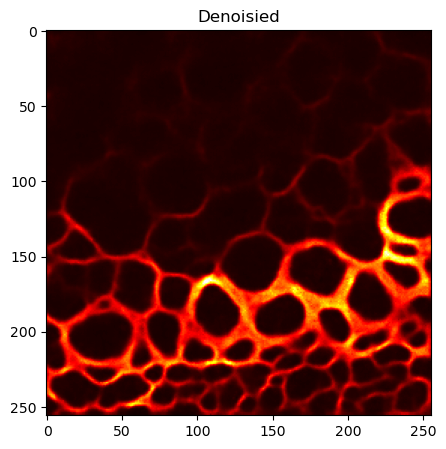

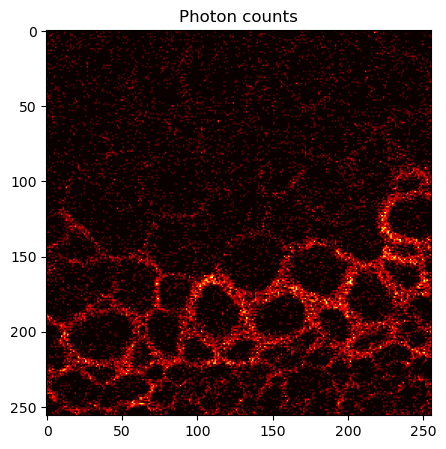

_______________________________________ 165
time (s): 4.366210460662842 time per image (s) 4.366210460662842


In [69]:
import matplotlib.image as mpimg
import time
import numpy as np
from Inference import sample_image

# We are starting with an image containing zeros,
# i.e., sampling from scratch

# we just have 1 channel
channels = 1
# we can sample multiple images at the same time in a batch
batch_size = 1
# for best results this should correspond to training pach size
pixels_x = 256
pixels_y = 256

inp_img =  torch.zeros(batch_size ,channels, pixels_y, pixels_x).to(device)


for i in range(1):
    

    startTime = time.time()
    
    # sampling the image(s)
    #print(inp_img.shape)
    denoised, photons, stack, iterations = sample_imaging(inp_img,
                                                        model, 
                                                        beta = 0.05,
                                                        save_every_n = 10,
                                                        max_psnr = -5)

    
    # In case we do multiple images in a batch, we show all of them.
    for j in range(denoised.shape[0]):
            print(iterations)

            #print(denoised.shape)
            plt.figure(figsize = (5,5))
            plt.imshow(denoised[j,0], cmap='hot', vmin = 0,
                       vmax = np.percentile(denoised[j],99.99))
            plt.title('Denoisied')
            plt.show()
            
            plt.figure(figsize = (5,5))
            plt.imshow(photons[j,0], cmap='hot', vmin = 0,
                       vmax = np.percentile(photons[j],99.99))
            plt.title('Photon counts')
            plt.show()
            
            
    
    print('_______________________________________', iterations)
    
    endTime = time.time()
    elapsedTime = endTime - startTime
    print('time (s):', elapsedTime, 'time per image (s)', elapsedTime/denoised.shape[0])

0


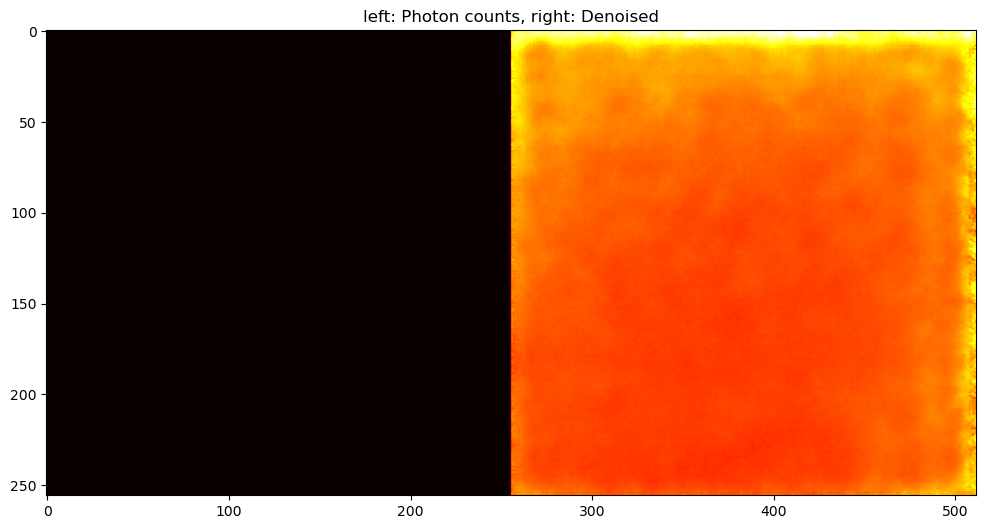

1


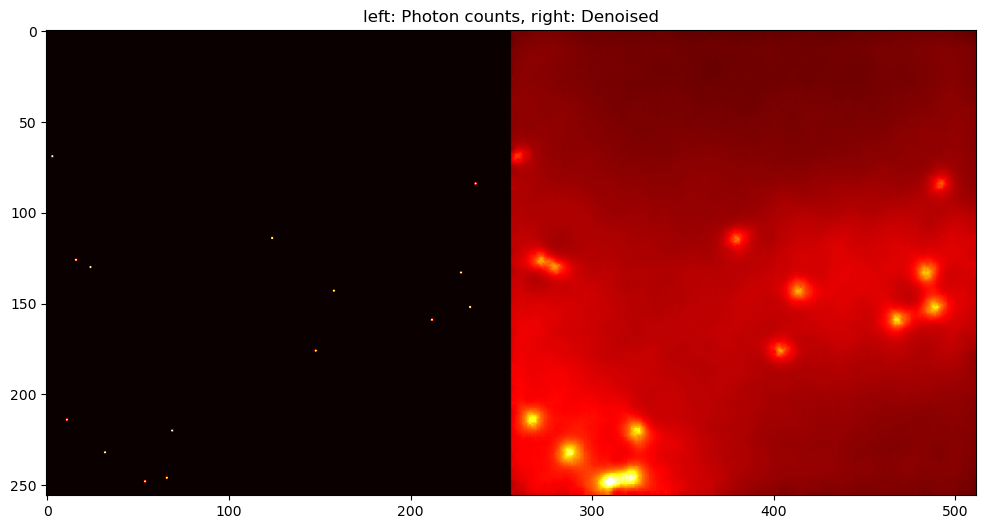

2


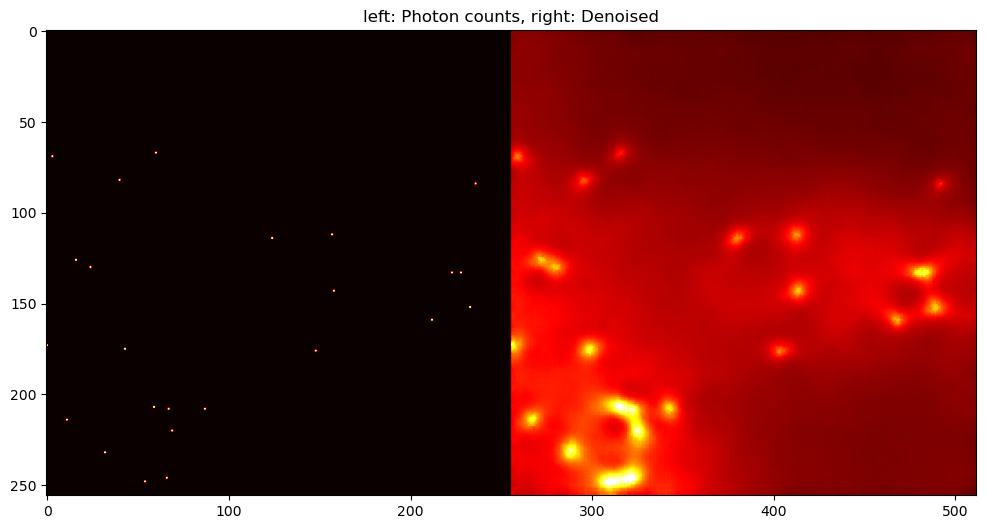

3


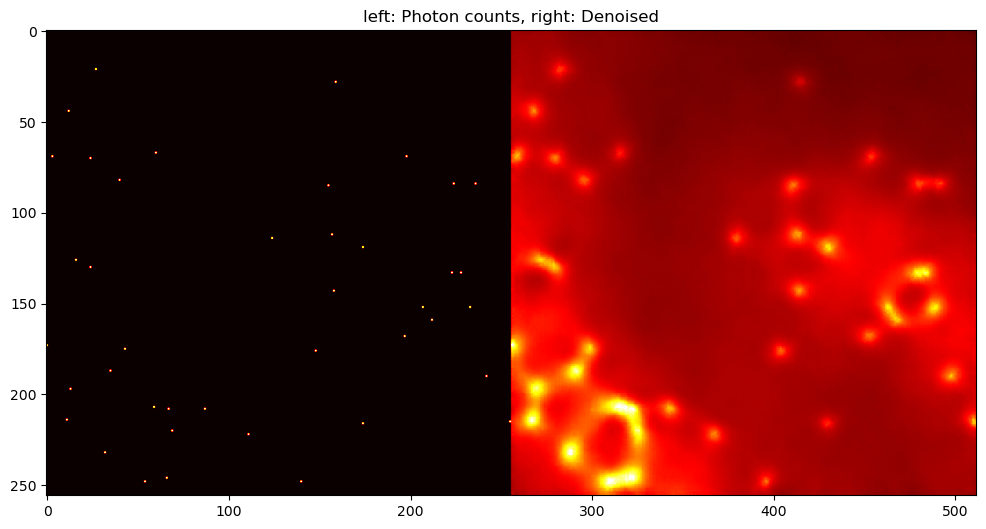

4


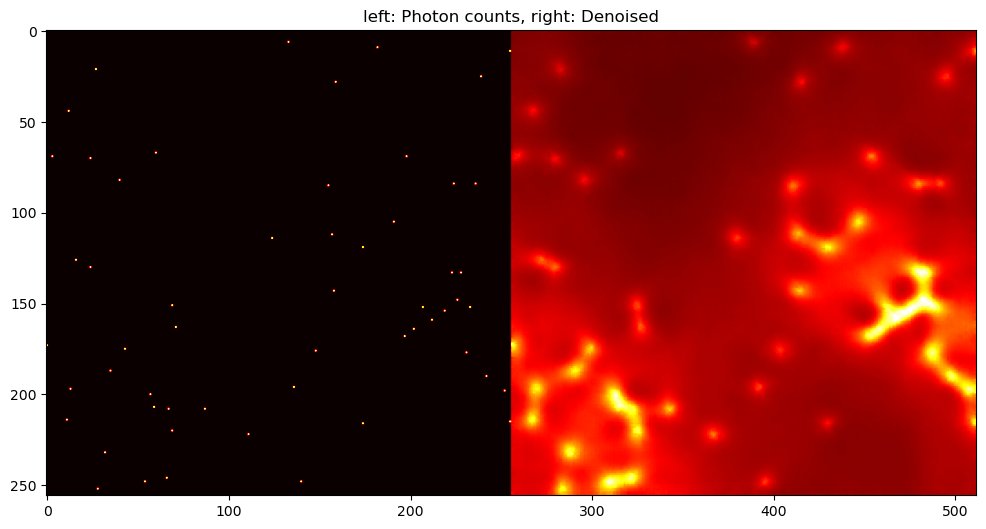

5


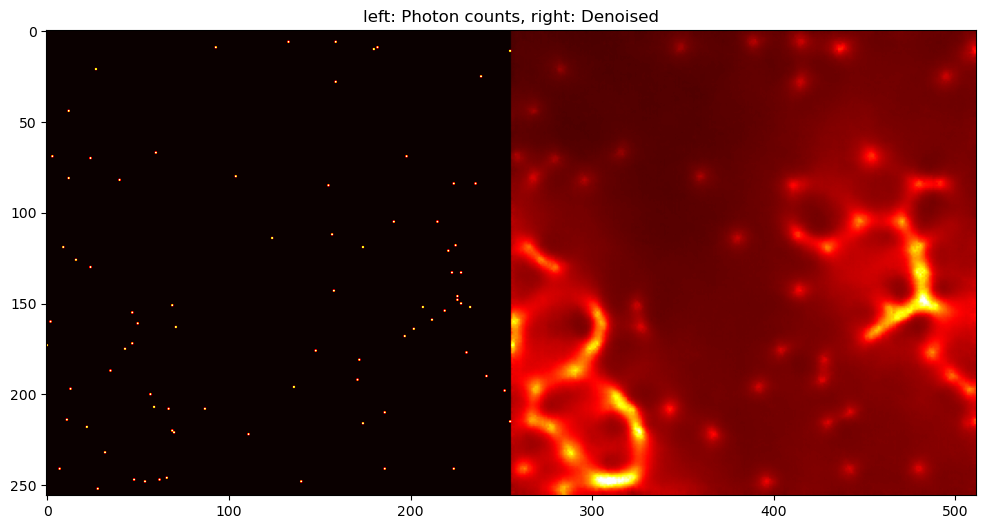

6


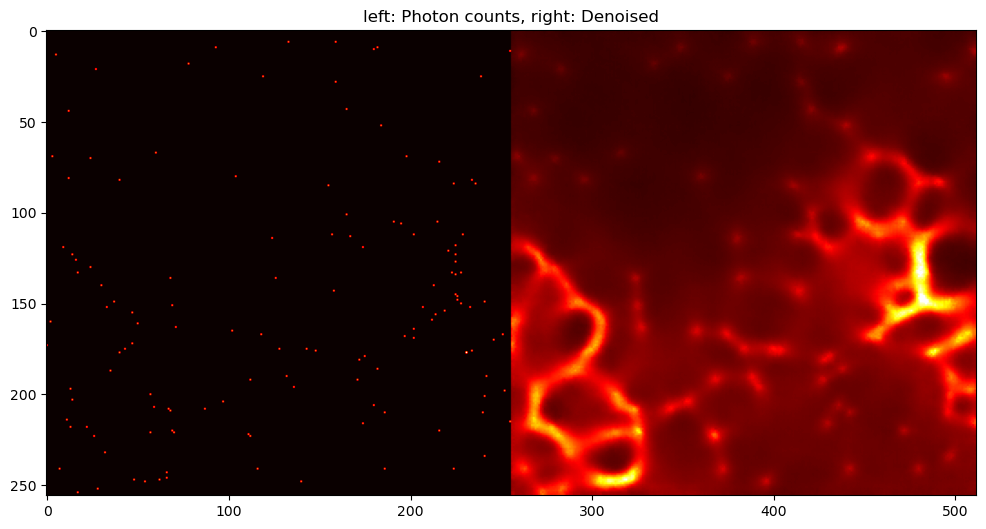

7


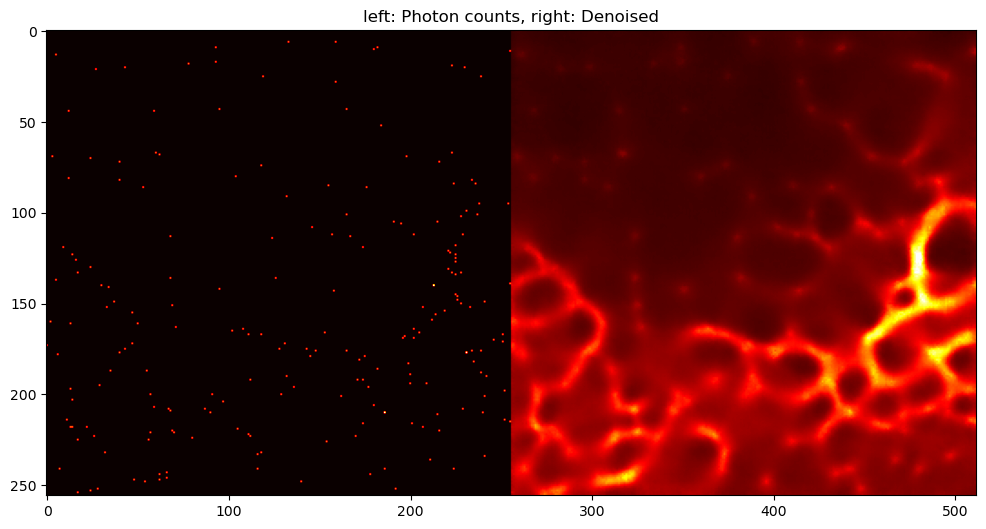

8


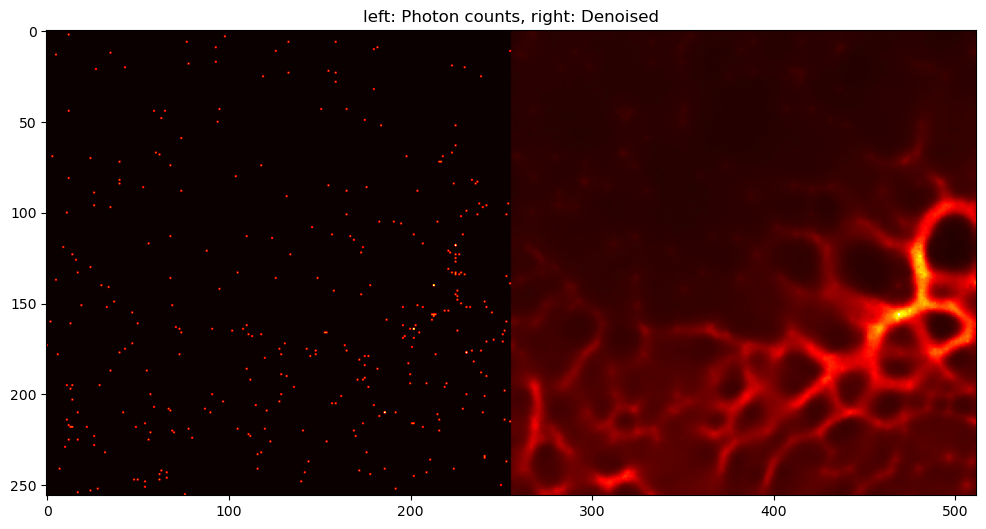

9


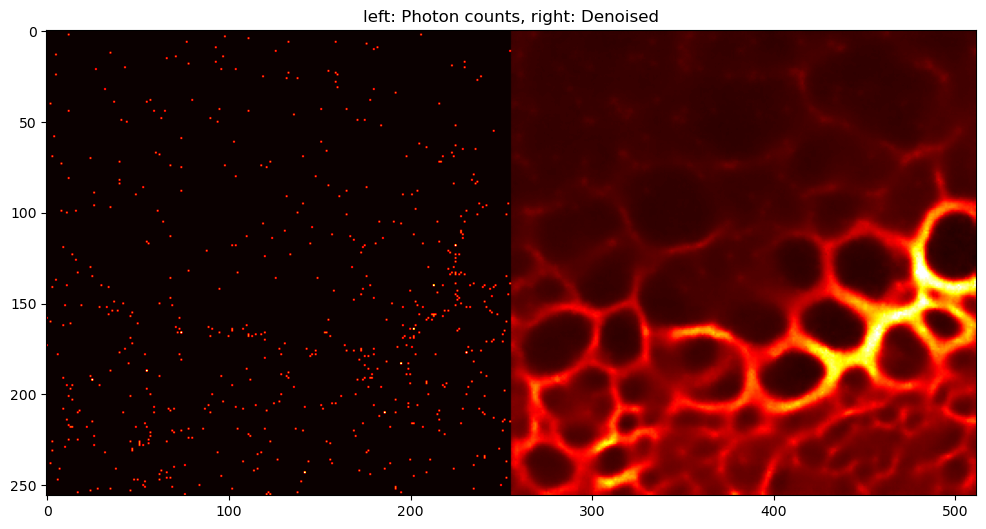

10


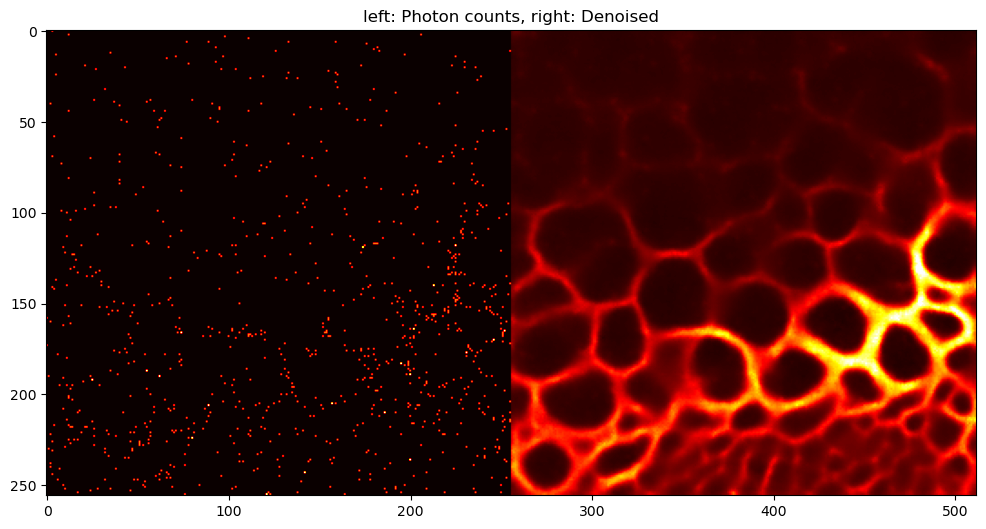

11


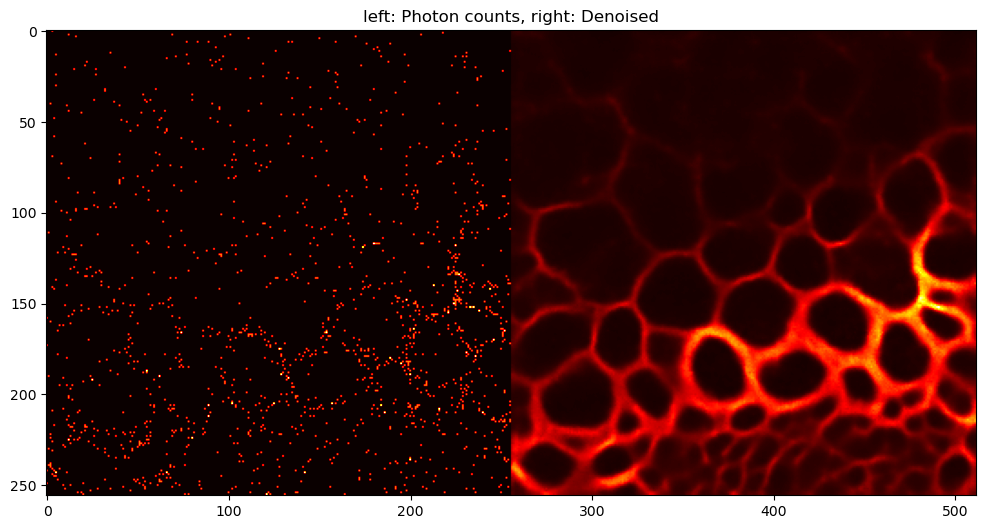

12


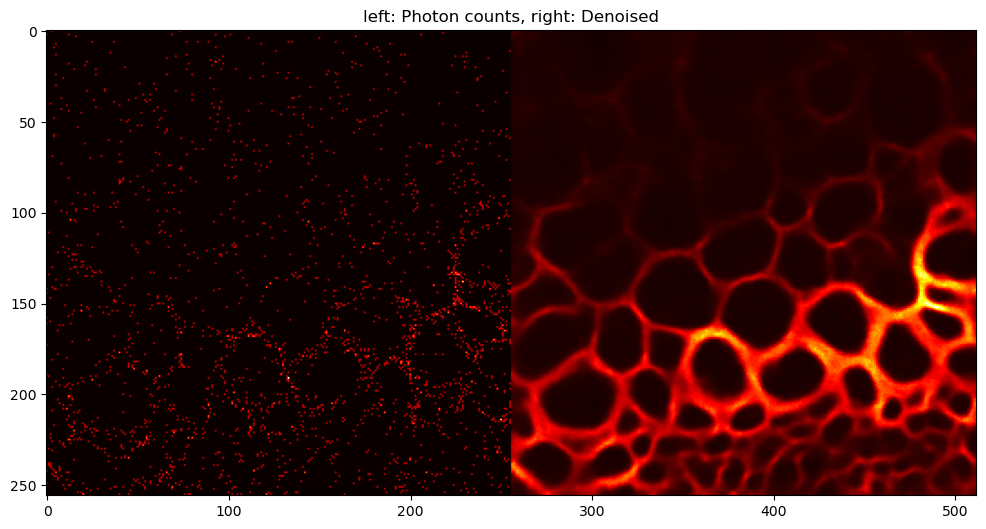

13


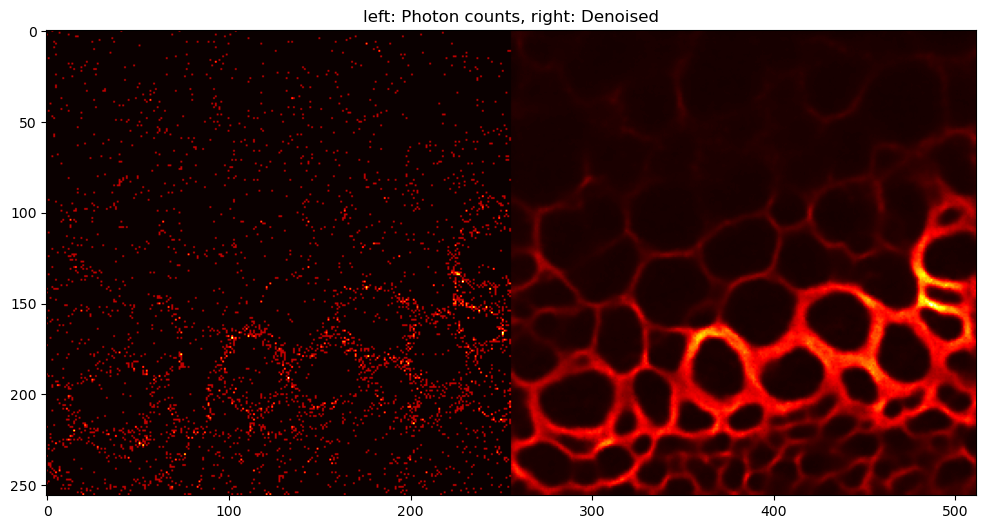

14


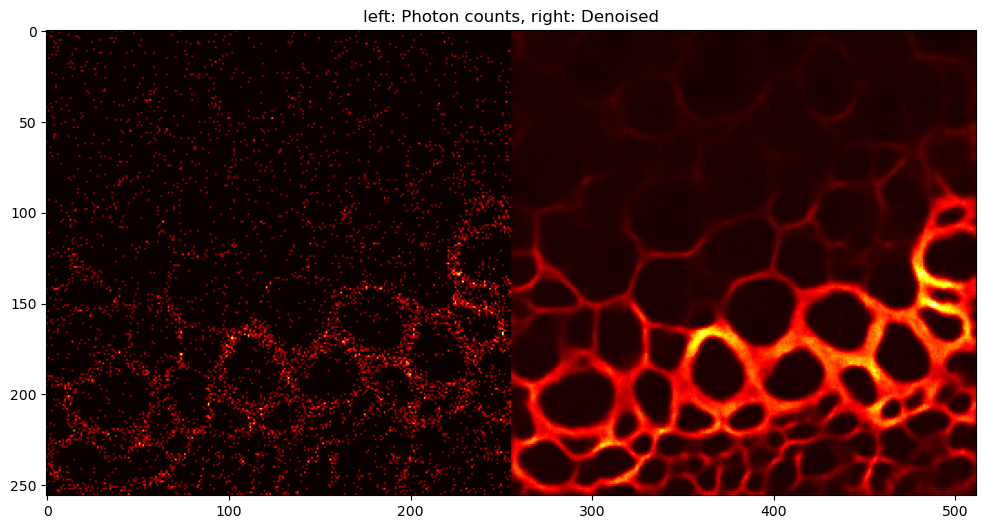

15


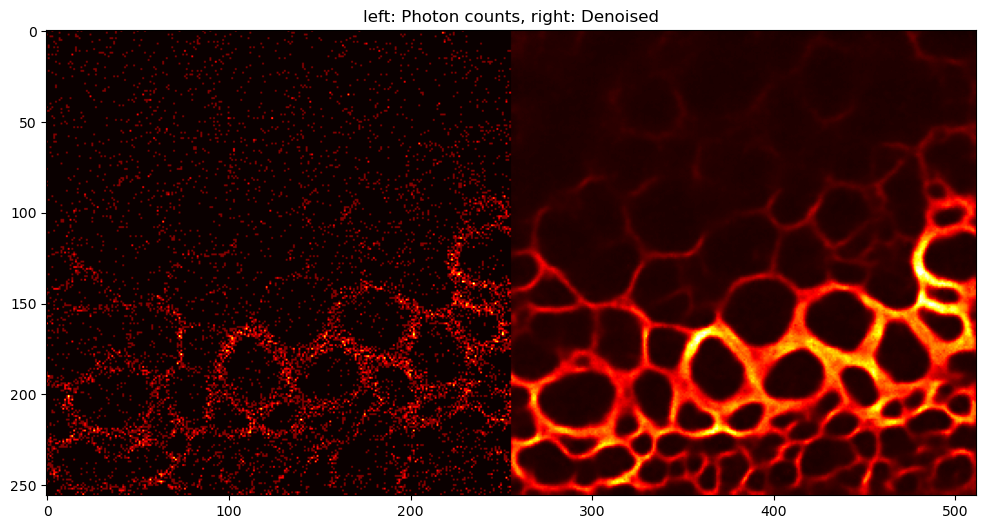

16


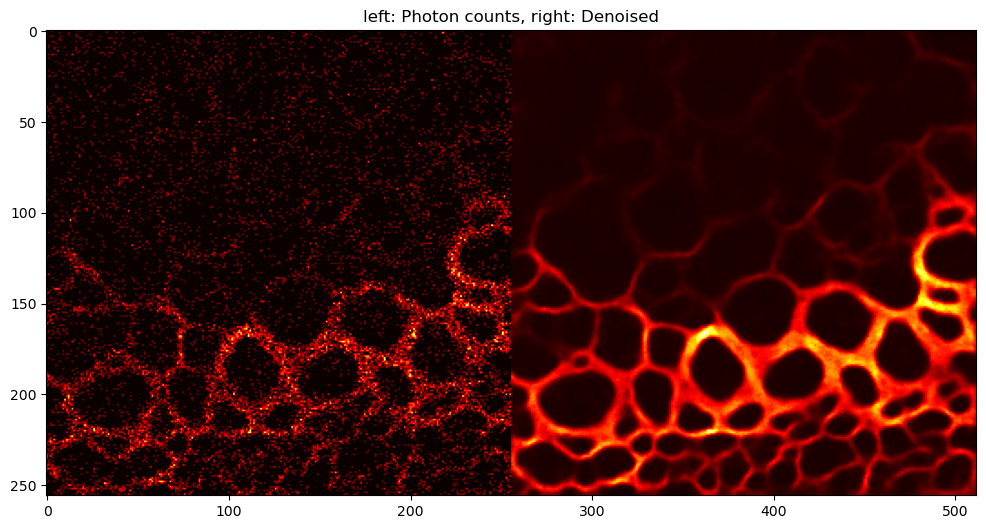

In [70]:
stack[0].shape
for i in range(len(stack)):
    im = stack[i]
    print(i)
    plt.figure(figsize = (12,12))
    plt.imshow(im,cmap ='hot', vmax = 0.9)
    plt.title('left: Photon counts, right: Denoised')
    plt.show()

In [13]:
name = "AttentionUNet-256x256"
CHECKPOINT_PATH = "./models/" 
Trainer = pl.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=maxepochs, 
                     callbacks=[ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_loss"),
                                LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience = 5)])
Trainer.fit(AttnUNet, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 4080 Laptop GPU') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name               | Type              | Params
----------------------------------------------------------
0  | Image_Projection   | Conv2d            | 368   
1  | input_norm         | GroupNorm         | 16    
2  | input_Mish         | Mish              | 0     
3  | Temporal_Embedding | Temporal_Embedder | 1.3 K 
4  | Final_Upsample     | Up_Block          | 10.2 K
5  | DownBlocks         | ModuleList        | 6.6 M 


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

In [14]:
name = "AttentionUNet-256x256"
CHECKPOINT_PATH = "./models/" 
Trainer = pl.Trainer(default_root_dir=os.path.join(CHECKPOINT_PATH, name), gradient_clip_val=0.5,
                     accelerator= "gpu", devices = [0],
                     max_epochs=maxepochs, 
                     callbacks=[ModelCheckpoint(save_weights_only=True, mode="min", monitor="val_loss"),
                                LearningRateMonitor("epoch"),
                                EarlyStopping('val_loss', patience = 5)])
Trainer.fit(AttnUNet, Train_Loader, Validation_Loader)
Trainer.save_checkpoint(os.path.join(CHECKPOINT_PATH, name)+'.ckpt')

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 4080 Laptop GPU') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name               | Type              | Params
----------------------------------------------------------
0  | Image_Projection   | Conv2d            | 368   
1  | input_norm         | GroupNorm         | 16    
2  | input_Mish         | Mish              | 0     
3  | Temporal_Embedding | Temporal_Embedder | 1.3 K 
4  | Final_Upsample     | Up_Block          | 7.6 K 
5  | DownBlocks         | ModuleList        | 6.6 M 


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

: 